In [ ]:
import cv2

img = cv2.imread( '/content/The Dark Knight.jpg', cv2.IMREAD_GRAYSCALE)
complement = 255 - img
cv2.imwrite("img_complement.png", complement)


True

Original Color


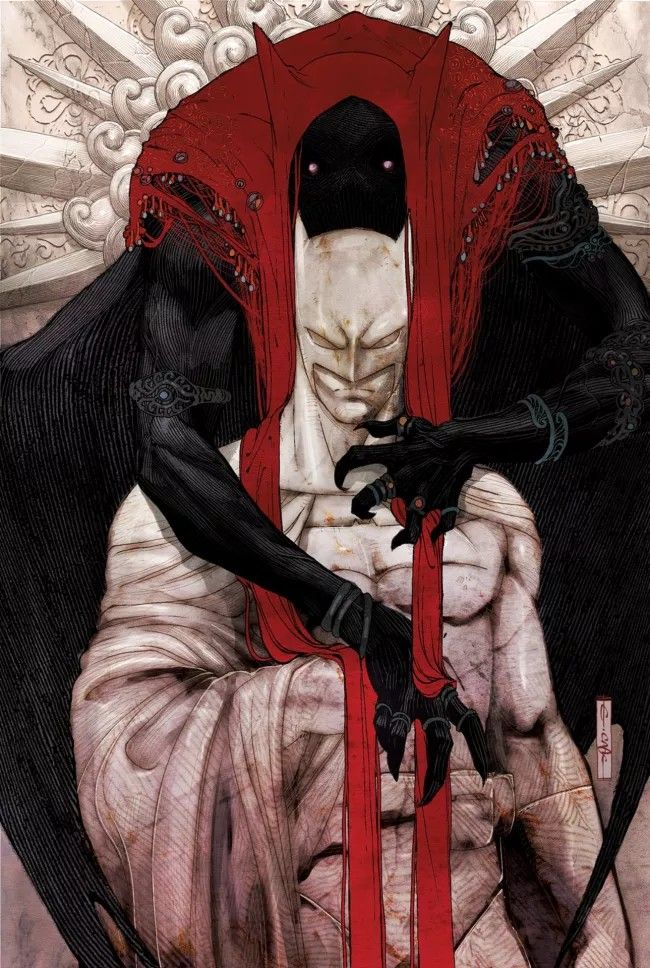

Negative Color


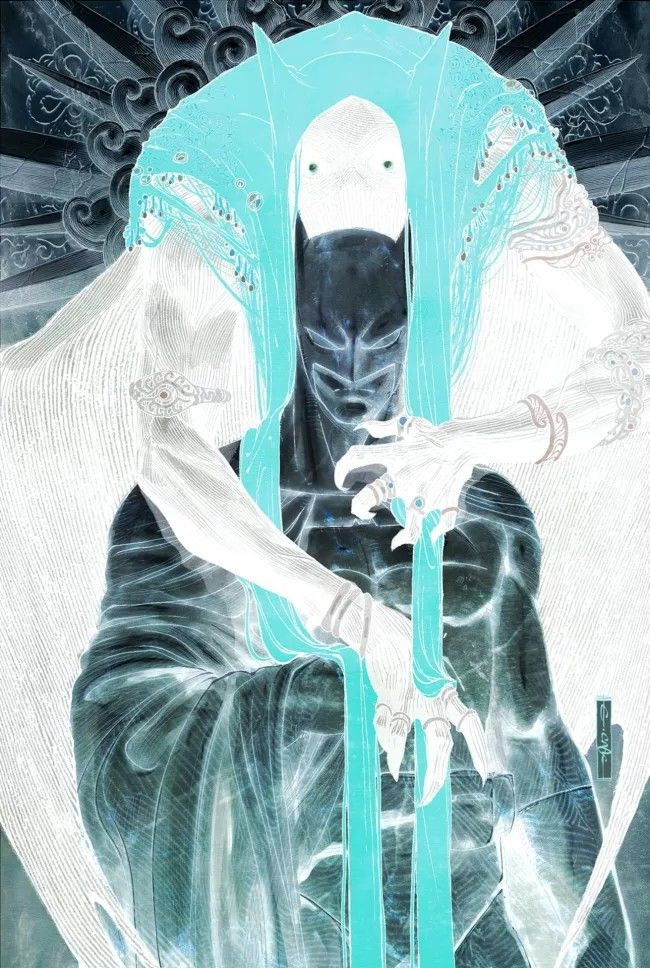

Grayscale


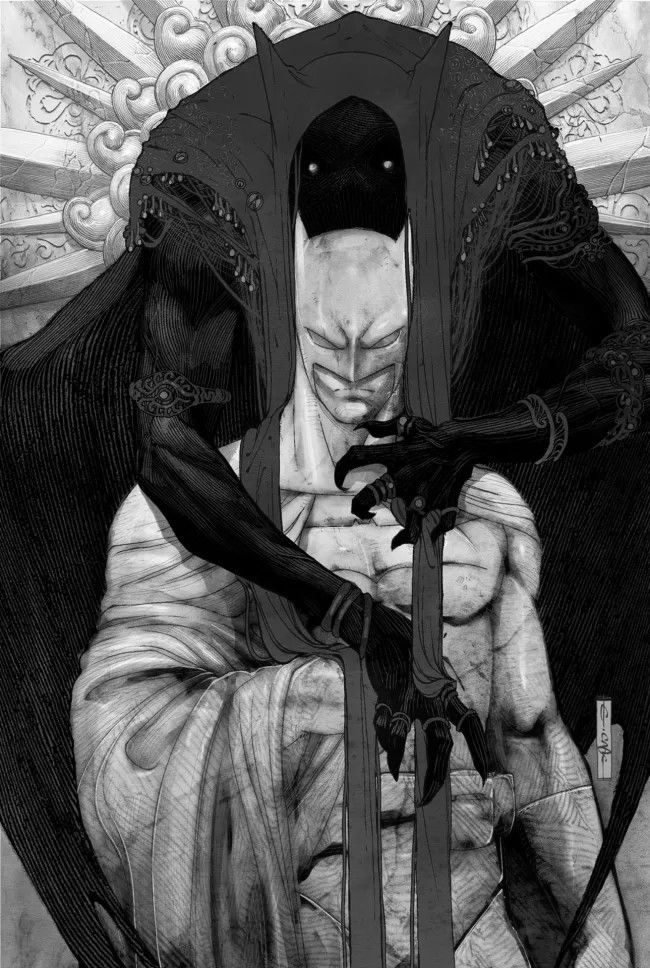

Negative Grayscale


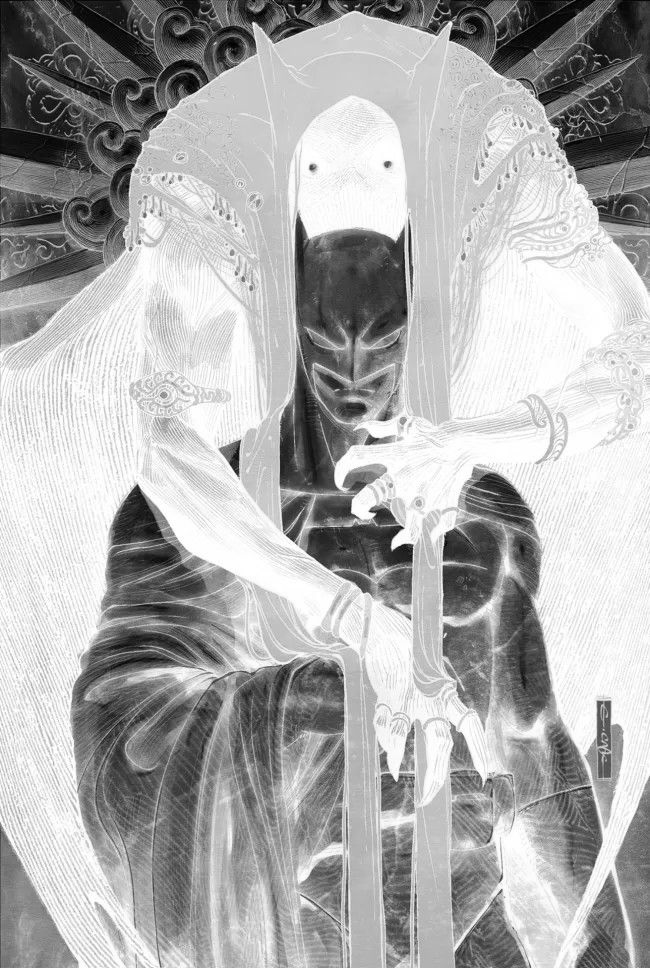

Binary


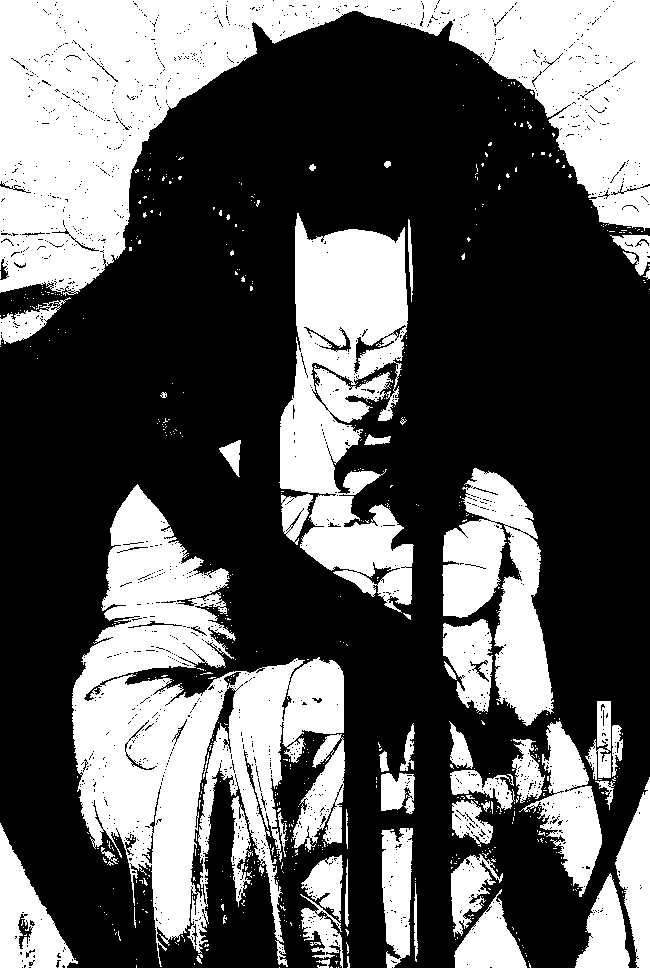

Negative Binary


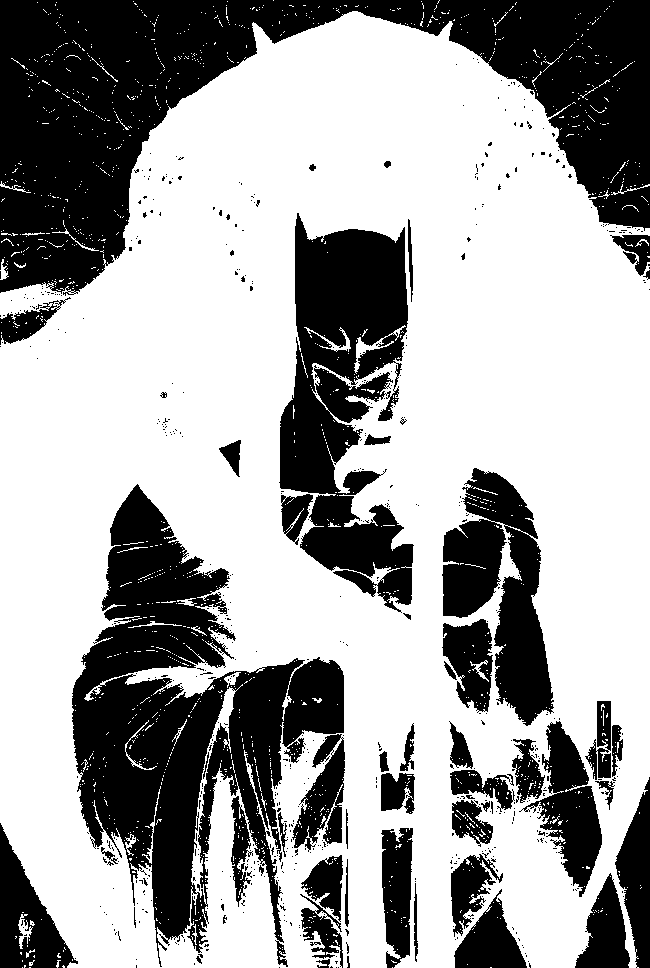

In [ ]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Load the colored image
img = cv2.imread("/content/The Dark Knight.jpg")

# ----------------- Step 1: Negative of Color Image -----------------
negative_color = 255 - img

# ----------------- Step 2: Convert to Grayscale -----------------
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
negative_gray = 255 - gray

# ----------------- Step 3: Convert Grayscale to Binary -----------------
_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
negative_binary = 255 - binary

print("Original Color")
cv2_imshow(img)
print("Negative Color")
cv2_imshow(negative_color)

print("Grayscale")
cv2_imshow(gray)
print("Negative Grayscale")
cv2_imshow(negative_gray)

print("Binary")
cv2_imshow(binary)
print("Negative Binary")
cv2_imshow(negative_binary)


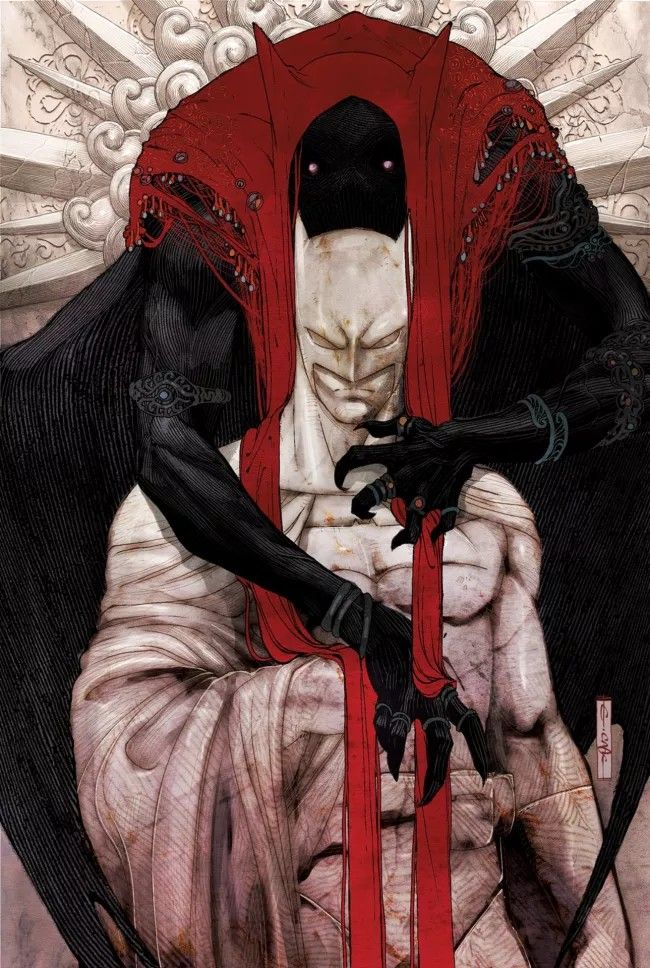

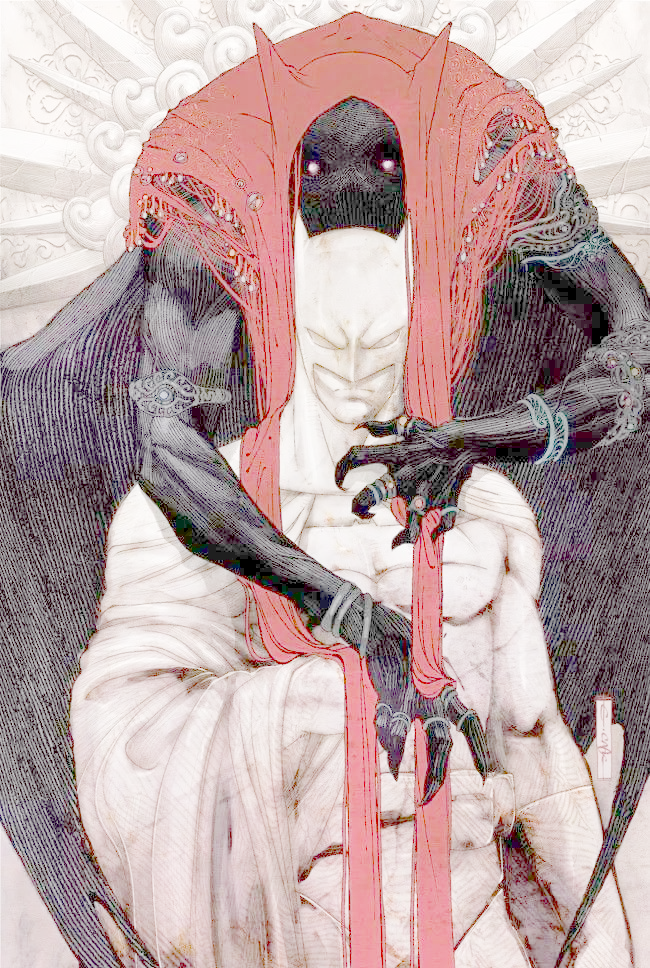

In [ ]:
# s= c*log(1 + r)

# c= constant
# r = intensity value

import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread("/content/The Dark Knight.jpg")

img_float = img.astype(np.float32)

c = 255 / np.log(1 + np.max(img_float))
log_img = c*np.log1p(img_float)
log_img = np.uint8(log_img)
cv2_imshow(img)
cv2_imshow(log_img)

Enter the value of gamma: 0.023


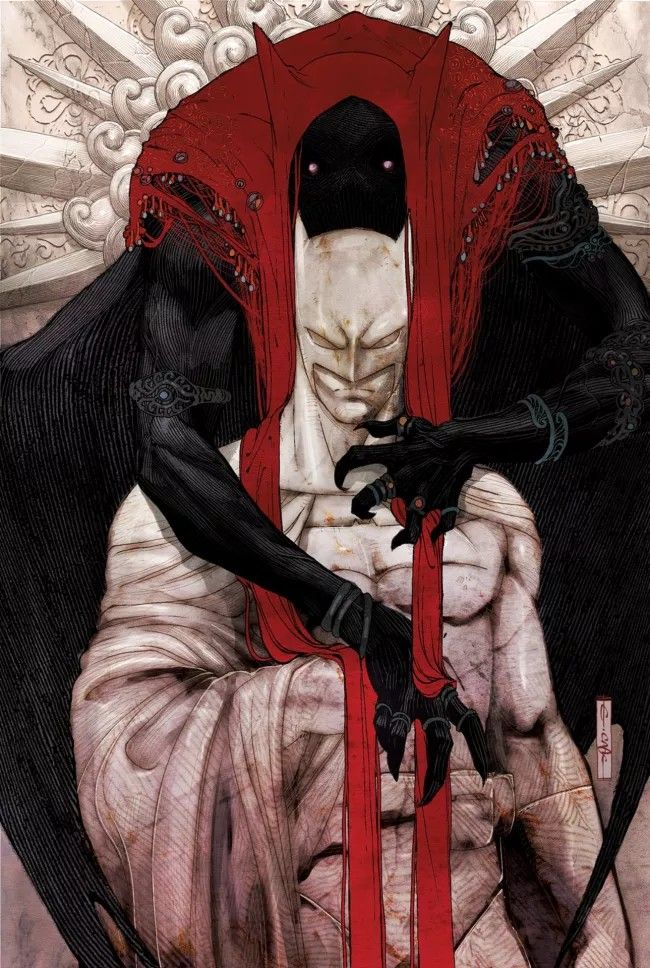

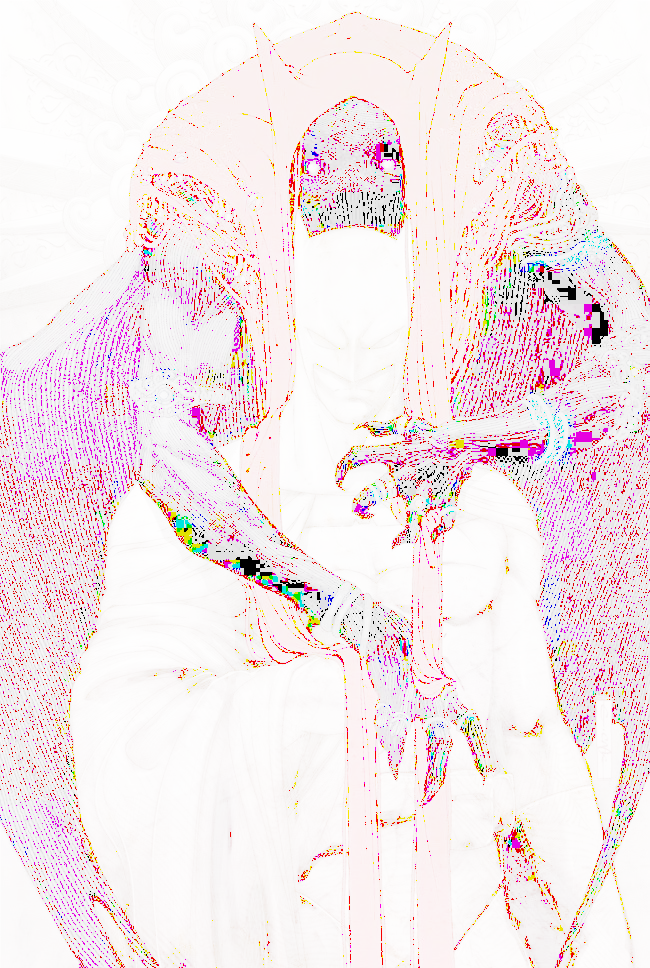

In [ ]:

import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread("/content/The Dark Knight.jpg")

img_float = img.astype(np.float32)

gamma = float(input("Enter the value of gamma: "))
c = 1

img_norm = img / 255
gamma_img = c * np.power(img_norm, gamma)
gamma_img = np.uint8(gamma_img * 255)

log_img = np.uint8(log_img)
cv2_imshow(img)
cv2_imshow(gamma_img)

(1116, 736, 3)
(968, 650, 3)
(500, 500, 3)
(500, 500, 3)


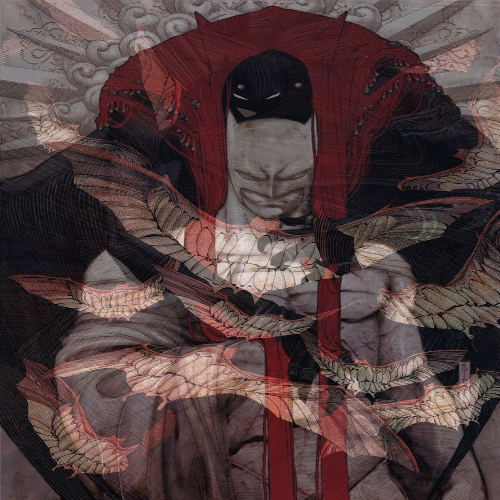

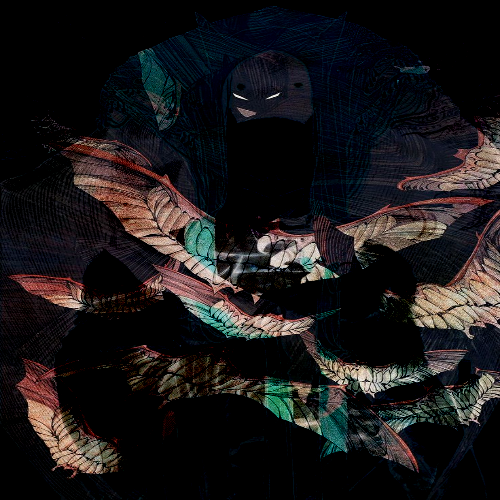

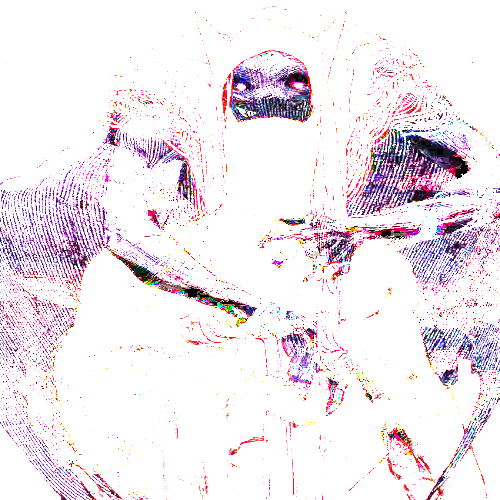

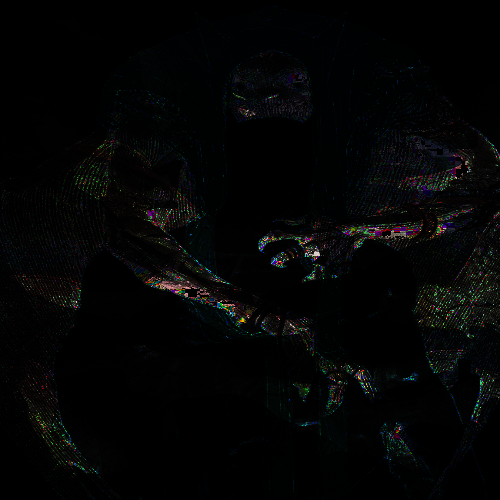

In [ ]:
# Arithmatic Operations on Images

from google.colab.patches import cv2_imshow
import cv2
import numpy as np

image1 = cv2.imread("/content/Batman.jpg")
image2 = cv2.imread("/content/The Dark Knight.jpg")

print(image1.shape)
print(image2.shape)

image1 = cv2.resize(image1, (500, 500))
image2 = cv2.resize(image2, (500, 500))

print(image1.shape)
print(image2.shape)

weightedSum = cv2.addWeighted(image1, 0.5, image2, 0.5, 0)
cv2_imshow(weightedSum)

weightedSubtract = cv2.subtract(image1, image2)
cv2_imshow(weightedSubtract)

weightedMultiply = cv2.multiply(image1, image2)
cv2_imshow(weightedMultiply)

weightedDivide = cv2.divide(image1, image2)
cv2_imshow(weightedDivide)


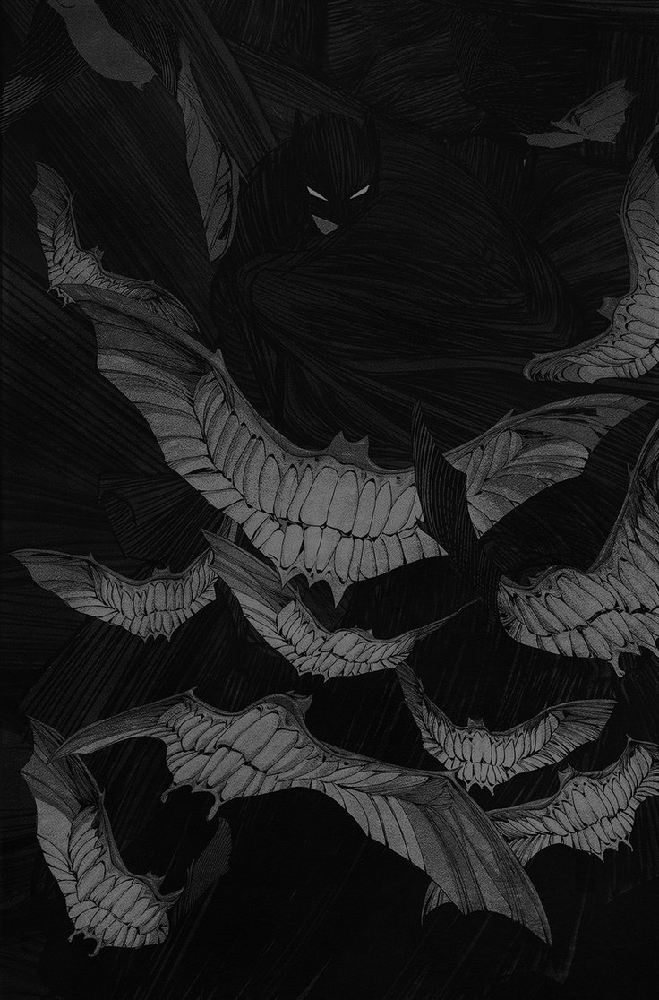

In [ ]:
brightness_factor = 1.5

image = cv2.imread('/content/Batman.jpg' , cv2.IMREAD_GRAYSCALE)

if brightness_factor > 1:
  brightended_image = cv2.multiply(image , np.array([brightness_factor]))
  cv2_imshow(brightended_image)
else:
  darkened_image = cv2.divide(image , np.array([1 / abs(brightness_factor)]))
  cv2_imshow(darkened_image)

Enter Input Range(r1 , r2): 1 128
Enter Input Range(s1 , s2): 1 64


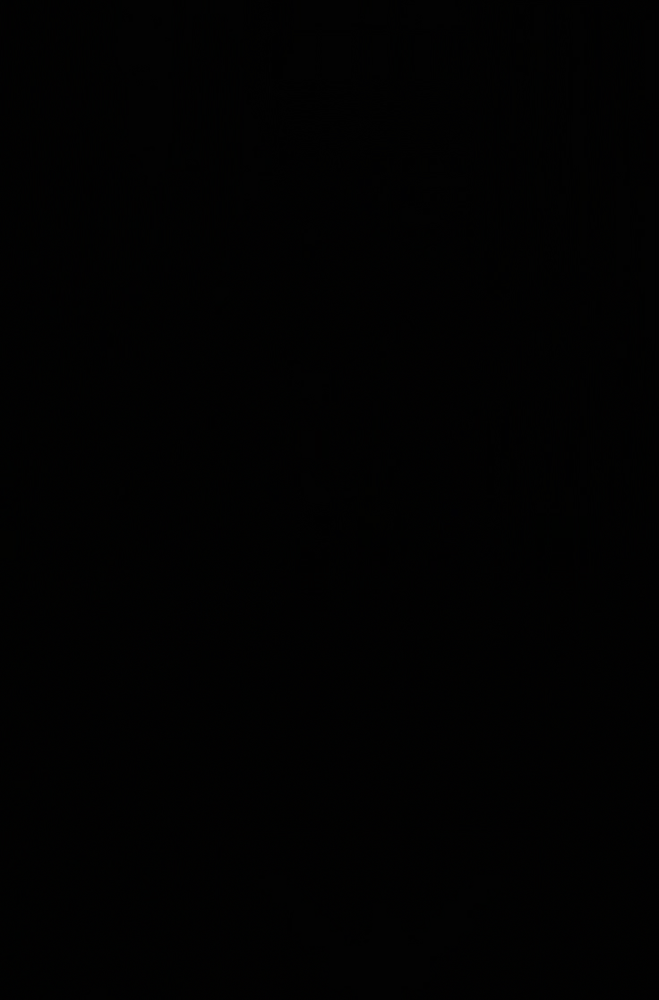

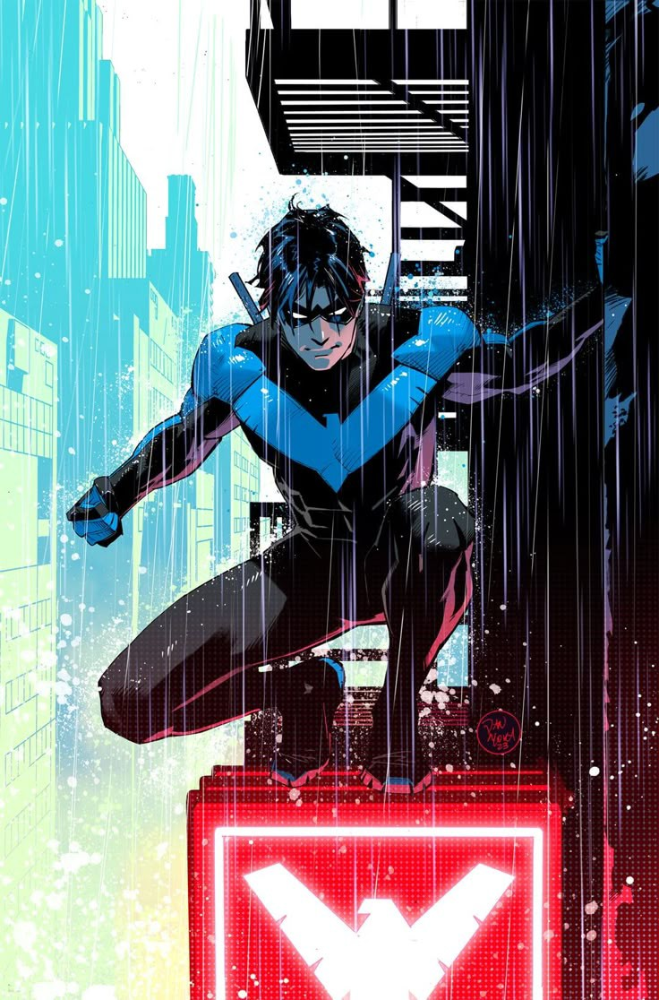

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
image = cv2.imread('/content/Nightwing.jpg')

r1 , r2 = map(int , input("Enter Input Range(r1 , r2): ").split())
s1 , s2 = map(int , input("Enter Input Range(s1 , s2): ").split())

stretched = ((image - r1) * (s2 - s1) / (r2 - r1)) + s1
stretched = np.clip(stretched , 0 , 255).astype(np.uint8)

cv2_imshow(stretched)
cv2_imshow(image)

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 5ms/step - accuracy: 0.9035 - loss: 0.3256 - val_accuracy: 0.9772 - val_loss: 0.0640
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9844 - loss: 0.0476 - val_accuracy: 0.9886 - val_loss: 0.0356
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.9904 - loss: 0.0323 - val_accuracy: 0.9839 - val_loss: 0.0487
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9929 - loss: 0.0241 - val_accuracy: 0.9910 - val_loss: 0.0270
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9942 - loss: 0.0185 - val_accuracy: 0.9901 - val_loss: 0.0300
313/313 - 1s - 2ms/step - accuracy: 0.9901 - loss: 0.0300
Test accuracy: 0.9901


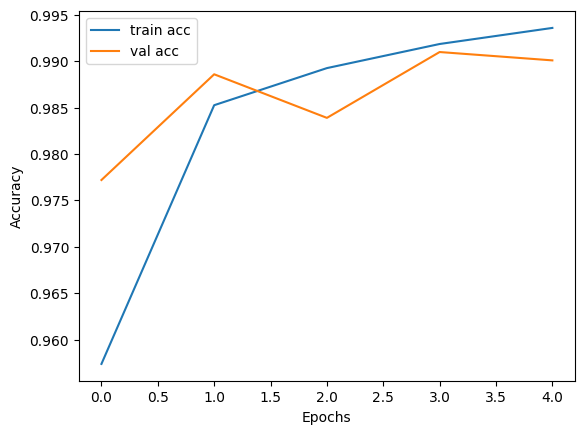

In [ ]:
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt
import numpy as np

# ----------------- Load Dataset -----------------
(x_train, y_train), (x_test, y_test) = datasets.mnist.load_data()

# Reshape for CNN: (num_samples, height, width, channels)
x_train = x_train.reshape((x_train.shape[0], 28, 28, 1))
x_test = x_test.reshape((x_test.shape[0], 28, 28, 1))

# Normalize pixel values
x_train, x_test = x_train / 255.0, x_test / 255.0

# ----------------- Build CNN Model -----------------
model = models.Sequential([
    layers.Conv2D(32, (3,3), activation='relu', input_shape=(28,28,1)),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(10, activation='softmax')  # 10 classes for digits
])

# ----------------- Compile Model -----------------
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# ----------------- Train Model -----------------
history = model.fit(x_train, y_train, epochs=5,
                    validation_data=(x_test, y_test))

# ----------------- Evaluate Model -----------------
test_loss, test_acc = model.evaluate(x_test, y_test, verbose=2)
print(f"Test accuracy: {test_acc:.4f}")

# ----------------- Plot Training History -----------------
plt.plot(history.history['accuracy'], label='train acc')
plt.plot(history.history['val_accuracy'], label='val acc')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


Training: 100%|██████████| 5/5 [00:49<00:00,  9.80s/epoch, loss=2.3013, acc=0.1124, val_loss=2.3011, val_acc=0.1135]



✅ Test accuracy: 0.1135


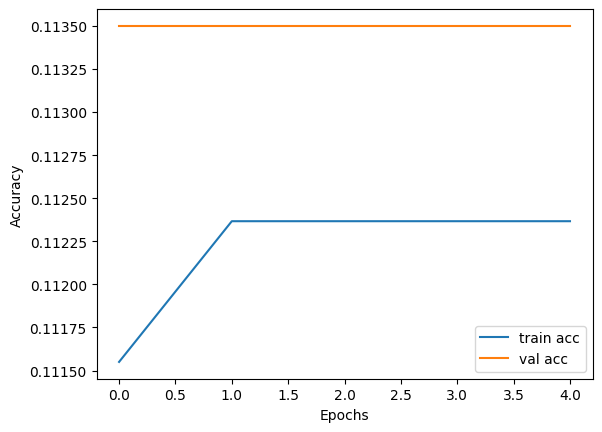

In [ ]:
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

# ----------------- Load Dataset -----------------
(x_train, y_train), (x_test, y_test) = datasets.mnist.load_data()

x_train = x_train.reshape((x_train.shape[0], 28, 28, 1))
x_test = x_test.reshape((x_test.shape[0], 28, 28, 1))

# Normalize
x_train, x_test = x_train / 255.0, x_test / 255.0

# ----------------- Build CNN Model -----------------
model = models.Sequential([
    layers.Conv2D(32, (3,3), activation='sigmoid', input_shape=(28,28,1)),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(10, activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# ----------------- Custom TQDM Callback -----------------
class TQDMProgressBar(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs = self.params['epochs']
        self.epoch_bar = tqdm(total=self.epochs, desc="Training", unit="epoch")

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        self.epoch_bar.set_postfix({
            "loss": f"{logs.get('loss'):.4f}",
            "acc": f"{logs.get('accuracy'):.4f}",
            "val_loss": f"{logs.get('val_loss'):.4f}",
            "val_acc": f"{logs.get('val_accuracy'):.4f}"
        })
        self.epoch_bar.update(1)

    def on_train_end(self, logs=None):
        self.epoch_bar.close()

# ----------------- Train with TQDM -----------------
history = model.fit(
    x_train, y_train,
    epochs=5,
    validation_data=(x_test, y_test),
    callbacks=[TQDMProgressBar()],
    verbose=0  # disable default Keras logs
)

# ----------------- Evaluate -----------------
test_loss, test_acc = model.evaluate(x_test, y_test, verbose=0)
print(f"\n✅ Test accuracy: {test_acc:.4f}")

# ----------------- Plot -----------------
plt.plot(history.history['accuracy'], label='train acc')
plt.plot(history.history['val_accuracy'], label='val acc')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


/tmp/ipython-input-4159475127.py:15: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.subplot(2,2,3), plt.hist(img.ravel(),256,[0,256])
/tmp/ipython-input-4159475127.py:18: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.subplot(2,2,4), plt.hist(equalized.ravel(),256,[0,256])


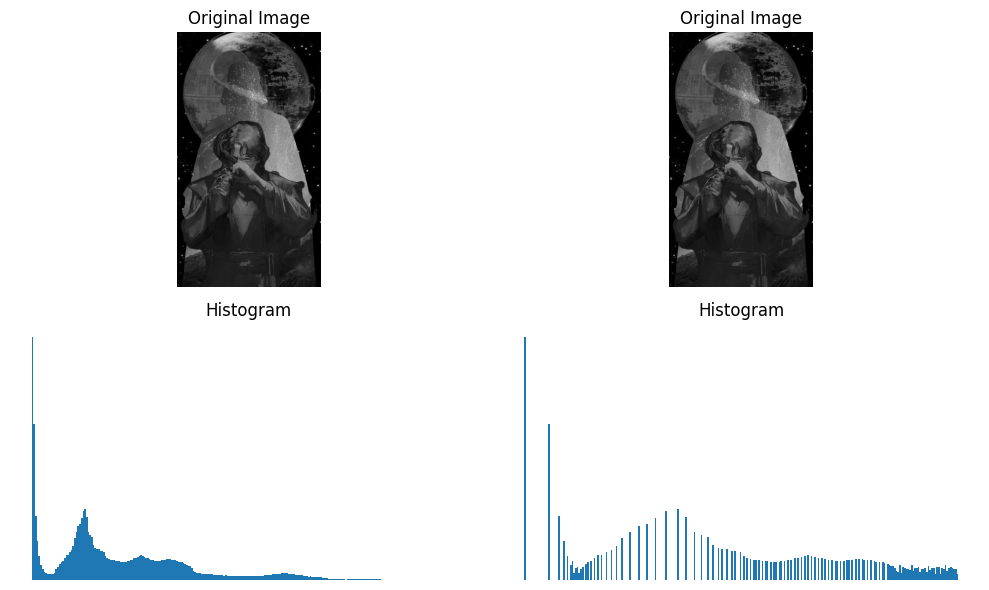

In [ ]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread("/content/Anakin Skywalker.jpg",cv2.IMREAD_GRAYSCALE)

equalized = cv2.equalizeHist(img)
plt.figure(figsize = (10,6))

plt.subplot(2,2,1), plt.imshow(img, cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([]) , plt.axis("off")

plt.subplot(2,2,2), plt.imshow(img, cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([]) , plt.axis("off")

plt.subplot(2,2,3), plt.hist(img.ravel(),256,[0,256])
plt.title('Histogram'), plt.xticks([]), plt.yticks([]) , plt.axis("off")

plt.subplot(2,2,4), plt.hist(equalized.ravel(),256,[0,256])
plt.title('Histogram'), plt.xticks([]), plt.yticks([]) , plt.axis("off")

plt.tight_layout()
plt.show()



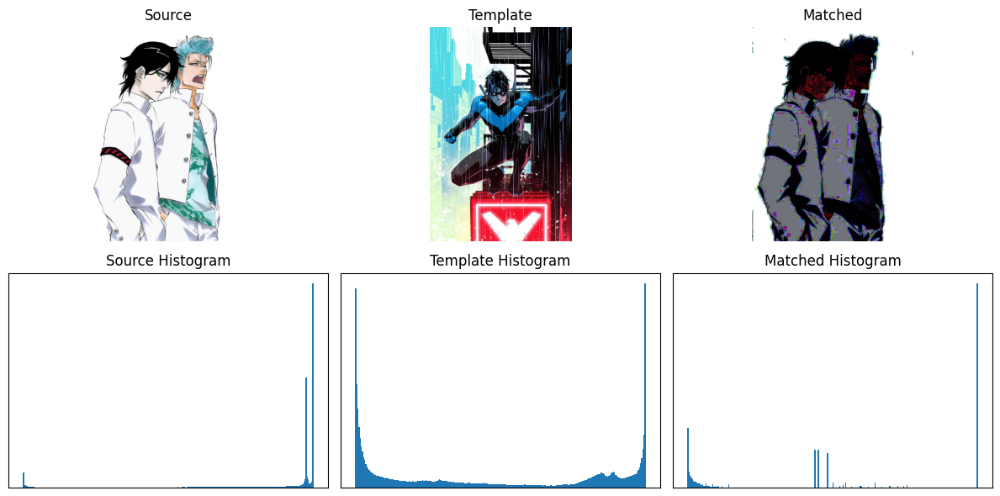

In [ ]:
from tempfile import template
import cv2
import matplotlib.pyplot as plt
from skimage.exposure import match_histograms

source = cv2.cvtColor(cv2.imread("/content/Grimjow and Ulquiorra.jpg"), cv2.COLOR_BGR2RGB)
template = cv2.cvtColor(cv2.imread("/content/Nightwing.jpg"), cv2.COLOR_BGR2RGB)

matched = match_histograms(source, template,channel_axis=-1)
plt.figure(figsize=(12,6))

plt.subplot(2,3,1), plt.imshow(source), plt.title("Source"), plt.axis("off")
plt.subplot(2,3,2), plt.imshow(template), plt.title("Template"), plt.axis("off")
plt.subplot(2,3,3), plt.imshow(matched), plt.title("Matched"), plt.axis("off")

plt.subplot(2,3,4), plt.hist(source.ravel(), bins=256, range=(0,256), fc="black"), plt.title("Source Histogram"), plt.xticks([]), plt.yticks([])
plt.subplot(2,3,5), plt.hist(template.ravel(), bins=256, range=(0,256), fc="black"), plt.title("Template Histogram"), plt.xticks([]), plt.yticks([])
plt.subplot(2,3,6), plt.hist(matched.ravel(), bins=256, range=(0,256), fc="black"), plt.title("Matched Histogram"), plt.xticks([]), plt.yticks([])

plt.tight_layout()
plt.show()

(([], []), ([], []))

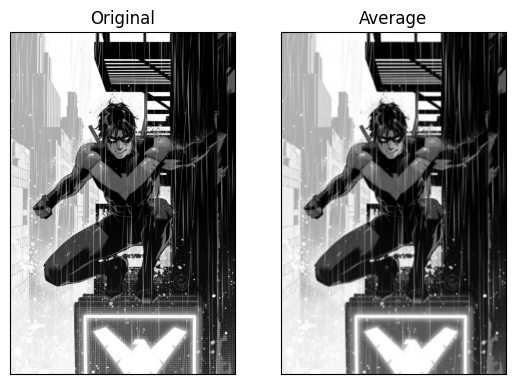

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread("/content/Nightwing.jpg", cv2.IMREAD_GRAYSCALE)

kernel_size = 5
avg_kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size ** 2)
img_avg = cv2.filter2D(img, -1, avg_kernel)

plt.subplot(1,2,1), plt.imshow(img, cmap='gray'), plt.title('Original')
plt.xticks([]), plt.yticks([])

plt.subplot(1,2,2), plt.imshow(img_avg, cmap='gray'), plt.title('Average')
plt.xticks([]), plt.yticks([])

(([], []), ([], []))

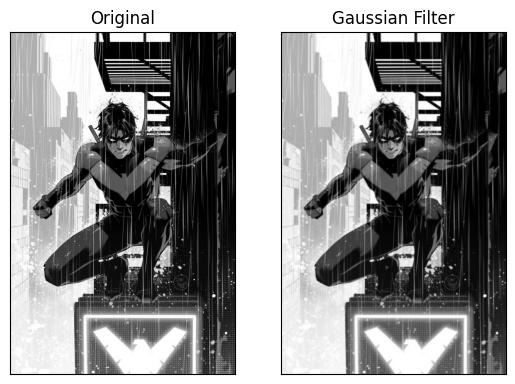

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread("/content/Nightwing.jpg", cv2.IMREAD_GRAYSCALE)

kernel_size = 5
img_gaussian = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

plt.subplot(1,2,1), plt.imshow(img, cmap='gray'), plt.title('Original')
plt.xticks([]), plt.yticks([])

plt.subplot(1,2,2), plt.imshow(img_gaussian, cmap='gray'), plt.title('Gaussian Filter')
plt.xticks([]), plt.yticks([])

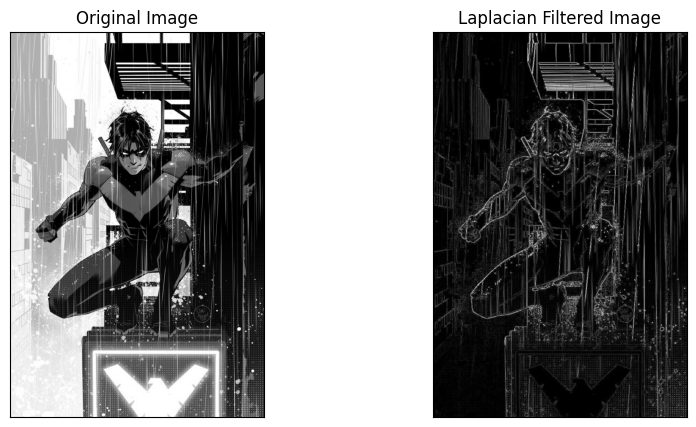

In [6]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# ----------------- Read Image -----------------
img = cv2.imread("/content/Nightwing.jpg", cv2.IMREAD_GRAYSCALE)

# ----------------- Apply Laplacian Filter -----------------
laplacian = cv2.Laplacian(img, cv2.CV_64F)   # computes 2nd derivative
laplacian = cv2.convertScaleAbs(laplacian)   # convert to 8-bit image
sharp_lap = cv2.addWeighted(img, 1, laplacian, -1, 0)

# ----------------- Display -----------------
plt.figure(figsize=(10,5))

plt.subplot(1,2,1), plt.imshow(img, cmap='gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])

plt.subplot(1,2,2), plt.imshow(laplacian, cmap='gray')
plt.title('Laplacian Filtered Image'), plt.xticks([]), plt.yticks([])

plt.show()


In [7]:
sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)
sobel = cv2.magnitude(sobelx, sobely)
sobel = cv2.convertScaleAbs(sobel)

